Section 0.1
Data Preprocessing Dogs vs. Cats Dataset

In [ ]:
import cv2
import os
from sklearn.model_selection import train_test_split
import zipfile
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Bring in data
with zipfile.ZipFile("/content/All Data.zip","r") as z:
    z.extractall(".")
with zipfile.ZipFile("train.zip","r") as z:
    z.extractall(".")
with zipfile.ZipFile("test.zip","r") as z:
    z.extractall(".")
# with zipfile.ZipFile("allTrain.zip","r") as z:
#     z.extractall(".")
#lambda function to assign catagory 0 for Cat or category 1 for Dog
convert = lambda category : int(category == 'dog')

#Loop through data and add to training X/Y
def convertData(path, X, Y):
  for file in os.listdir(path):
    category = file.split(".")[0]
    category = convert(category)
    img_array = cv2.imread(os.path.join(path,file),cv2.IMREAD_GRAYSCALE)
    new_img_array = cv2.resize(img_array, dsize=(64,64))
    X.append(new_img_array)
    Y.append(category)
  

trainCatPath = '/content/train/cats'
trainDogPath = '/content/train/dogs'
testCatPath = '/content/test/cats'
testDogPath = '/content/test/dogs'
# allTrainPath = '/content/allTrain'

X_Train = []
Y_Train = []
X_Test = []
Y_Test = []

#Seperate using convertData Cats
convertData(trainCatPath, X_Train, Y_Train)
convertData(testCatPath, X_Test, Y_Test)
#Seperate using convertData Dogs
convertData(trainDogPath, X_Train, Y_Train)
convertData(testDogPath, X_Test, Y_Test)

# change arrays to np.array
X_Train = np.array(X_Train)
Y_Train = np.array(Y_Train)

X_Test = np.array(X_Test)
Y_Test = np.array(Y_Test)

# scale data
X_Train = np.array(X_Train, dtype="float") / 255.0
X_Test = np.array(X_Test, dtype="float") / 255.0


Section 0.2 Data Preprocessing CIFAR-10 Dataset


In [ ]:
# Extract data
import zipfile
with zipfile.ZipFile("/content/AllCifar10data.zip","r") as z:
    z.extractall(".")

In [ ]:
# Make folders
import zipfile
from zipfile import ZipFile
zipNamesTrain = ["/content/AllCifar10data/airplane.zip","/content/AllCifar10data/automobile.zip","/content/AllCifar10data/bird.zip","/content/AllCifar10data/cat.zip","/content/AllCifar10data/deer.zip","/content/AllCifar10data/dog.zip","/content/AllCifar10data/frog.zip","/content/AllCifar10data/horse.zip","/content/AllCifar10data/ship.zip","/content/AllCifar10data/truck.zip"]
zipNamesTest = ["/content/AllCifar10data/airplaneTest.zip","/content/AllCifar10data/automobileTest.zip","/content/AllCifar10data/birdTest.zip","/content/AllCifar10data/catTest.zip","/content/AllCifar10data/deerTest.zip","/content/AllCifar10data/dogTest.zip","/content/AllCifar10data/frogTest.zip","/content/AllCifar10data/horseTest.zip","/content/AllCifar10data/shipTest.zip","/content/AllCifar10data/truckTest.zip"]
fileNamesTrain = ['/content/AllCifar10data/airplane','/content/AllCifar10data/automobile','/content/AllCifar10data/bird','/content/AllCifar10data/cat','/content/AllCifar10data/deer','/content/AllCifar10data/dog','/content/AllCifar10data/frog','/content/AllCifar10data/horse','/content/AllCifar10data/ship','/content/AllCifar10data/truck']
fileNamesTest = ['/content/AllCifar10data/airplaneTest','/content/AllCifar10data/automobileTest','/content/AllCifar10data/birdTest','/content/AllCifar10data/catTest','/content/AllCifar10data/deerTest','/content/AllCifar10data/dogTest','/content/AllCifar10data/frogTest','/content/AllCifar10data/horseTest','/content/AllCifar10data/shipTest','/content/AllCifar10data/truckTest']
classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
def zipNamesFunc(zipNames):
  for i in range(10):
    with zipfile.ZipFile(zipNames[i],"r") as z:
      z.extractall(".")

In [ ]:
# Helper function for creating folder
from google.colab import files
import os
count = 0
def makeDataSets(classes, fileNamesTrain, fileNamesTest):
  for i in range(10):
    for j in range(i, 10):
      if(i != j):
        name = "" + classes[i] + classes[j]
        name2 = "" + classes[i] + classes[j] + ".zip"
        zf = zipfile.ZipFile(name2, "w")
        for dirname, subdirs, files in os.walk(fileNamesTrain[i]):
          l = name + "/" + "train/" + classes[i]
          zf.write(dirname, l)
          for filename in files:
            u = l + "/" + filename
            zf.write(os.path.join(dirname, filename), u)
        for dirname, subdirs, files in os.walk(fileNamesTest[i]):
          l = name + "/" + "test/" + classes[i]
          zf.write(dirname, l)
          for filename in files:
            u = l + "/" + filename
            zf.write(os.path.join(dirname, filename), u)
  ########################################################          
        for dirname, subdirs, files in os.walk(fileNamesTrain[j]):
          l = name + "/" + "train/" + classes[j]
          zf.write(dirname, l)
          for filename in files:
            u = l + "/" + filename
            zf.write(os.path.join(dirname, filename), u)
        for dirname, subdirs, files in os.walk(fileNamesTest[j]):
          l = name + "/" + "test/" + classes[j]
          zf.write(dirname, l)
          for filename in files:
            u = l + "/" + filename
            zf.write(os.path.join(dirname, filename), u)
zipNamesFunc(zipNamesTest)
zipNamesFunc(zipNamesTrain)
makeDataSets(classes, fileNamesTrain, fileNamesTest)
print("Folders made: Refresh to check")

Folders made: Refresh to check


In [ ]:
# function to download files. Colab doesn't support this well
from google.colab import files
import time
def downloadFile(name):
  files.download(name)

def runDownload(classes, trainTest, zf):
  s = ".zip"
  for i in range(10):
    for j in range(i, 10):
      if(i != j):
        name = "" + classes[i] + classes[j] + s
        zf.write(name)


zf = zipfile.ZipFile("AllCifar10data.zip", "w")
runDownload(classes, 0, zf)
zf.close()
files.download("AllCifar10data.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Section 1.1 Convolutional Neural Network Model Creation


In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.optimizers import SGD
epochs = 50
batch_size = 32
def getModel():
  model = Sequential()
  model.add(Conv2D(32, (3, 3), input_shape=(64,64,3)))
  model.add(Activation('relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))

  model.add(Conv2D(32, (3, 3)))
  model.add(Activation('relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))

  model.add(Conv2D(64, (3, 3)))
  model.add(Activation('relu'))
  model.add(MaxPooling2D(pool_size=(2, 2)))

  model.add(Flatten())
  model.add(Dense(64))
  model.add(Activation('relu'))
  model.add(Dropout(0.5))
  model.add(Dense(1))
  model.add(Activation('sigmoid'))
  opt = SGD(learning_rate=0.001, momentum=0.9)
  model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])
  return model

Section 2.0 Data Augmentations



Section 2.1 Augmentation Plot Functions

In [ ]:
from numpy import expand_dims
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib import pyplot
#example image path
pathEx = '/content/test/dogs/dog.5050.jpg'
#function to display what each transformation does
def show(image, transformation):
  image = load_img(image)
  data = img_to_array(image)
  samples = expand_dims(data, 0)
  it = transformation.flow(samples, batch_size=1)
  # generate samples and plot
  for i in range(9):
    pyplot.subplot(330 + 1 + i)
    batch = it.next()
    image = batch[0].astype('uint8')
    pyplot.imshow(image)
  # show the figure
  pyplot.show()

def showSingle(image, transformation):  
  image = load_img(image)
  data = img_to_array(image)
  samples = expand_dims(data, 0)
  it = transformation.flow(samples, batch_size=1)
  # generate sample and plot
  pyplot.subplot(330 + 1)
  batch = it.next()
  image = batch[0].astype('uint8')
  pyplot.imshow(image)
  # show the figure
  pyplot.show()


Section 2.2 This section will display all of the image transformations available to increase dataset size


Section 2.21

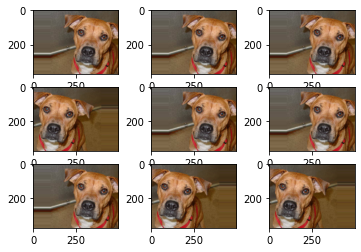

In [ ]:
#Horizontal Shift - Shift image focus left or right
horizontalShift = ImageDataGenerator(width_shift_range=[-100,100])
show(pathEx, horizontalShift)

Section 2.22

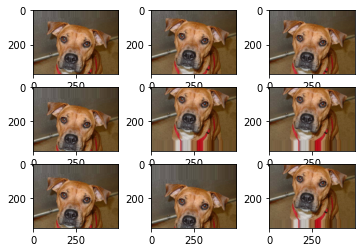

In [ ]:
#Vertical Shift - Shift image focus up or down
transformation = ImageDataGenerator(height_shift_range=0.25)
show(pathEx, transformation)

Section 2.23

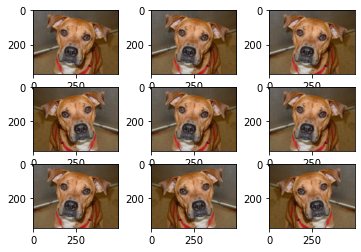

In [ ]:
#Horizontal Flip - flip image left or right
transformation = ImageDataGenerator(horizontal_flip=True)
show(pathEx, transformation)

Section 2.24

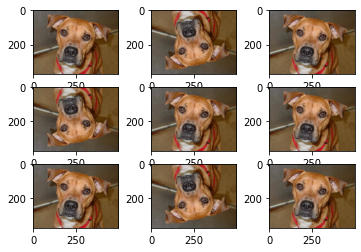

In [ ]:
#Vertical Flip - flip image up or down
transformation = ImageDataGenerator(vertical_flip=True)
show(pathEx, transformation)

Section 2.25

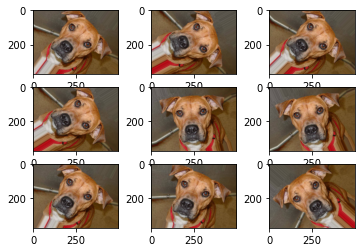

In [ ]:
#Random Rotation - rotates the image clockwise by a given number of degrees from 0 to 360
transformation = ImageDataGenerator(rotation_range=90)
show(pathEx, transformation)

Section 2.26

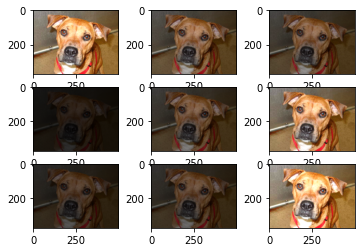

In [ ]:
#Random Brightness - randomly darkening images, brightening images, or both
transformation = ImageDataGenerator(brightness_range=[0,2])
show(pathEx, transformation)

Section 2.27

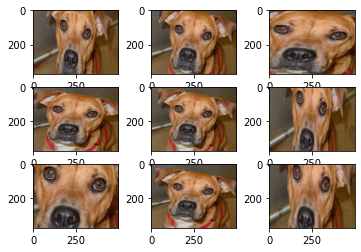

In [ ]:
#Random Zoom - randomly zooms the image in and either adds new pixel values around the image or interpolates pixel values respectively
transformation = ImageDataGenerator(zoom_range=[0.33,1.0])
show(pathEx, transformation)

Section 2.28

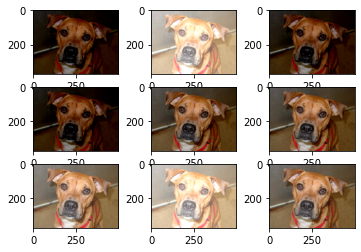

In [ ]:
#Channel Shift - shift the colors around so the model would be robust to variances in color
transformation = ImageDataGenerator(channel_shift_range=100)
show(pathEx, transformation)

Section 2.29

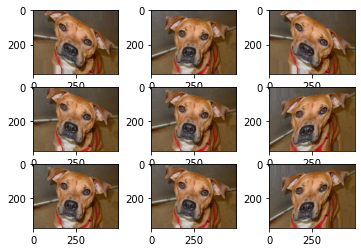

In [ ]:
#Shear - shear angle in counter-clockwise direction in degrees
transformation = ImageDataGenerator(shear_range=25)
show(pathEx, transformation)

Section 2.30

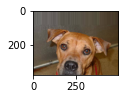

Constant, CVAL = 0


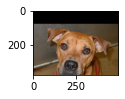

Constant, CVAL = 5


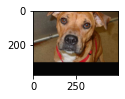

Reflect


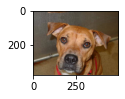

Wrap


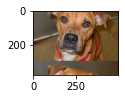

In [ ]:
#Fill Mode - Points outside the boundaries of the input are filled accordingly
transformation = ImageDataGenerator(height_shift_range=0.5, fill_mode="nearest")
showSingle(pathEx, transformation)
# If fill_mode = constant, cval can be used for points outside the boundries
print("Constant, CVAL = 0")
transformation = ImageDataGenerator(height_shift_range=[0.2,0.2], fill_mode="constant", cval=0)
showSingle(pathEx, transformation)
print("Constant, CVAL = 5")
transformation = ImageDataGenerator(height_shift_range=[0.2,0.2], fill_mode="constant", cval=5)
showSingle(pathEx, transformation)
print("Reflect")
transformation = ImageDataGenerator(height_shift_range=0.5, fill_mode="reflect")
showSingle(pathEx, transformation)
print("Wrap")
transformation = ImageDataGenerator(height_shift_range=0.5, fill_mode="wrap")
showSingle(pathEx, transformation)

Section 2.31

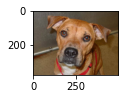

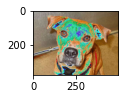

In [ ]:
#Rescale - multiply the data by th value provided(after applying all other tranformations)
transformation = ImageDataGenerator(rescale=None)
showSingle(pathEx, transformation)
transformation = ImageDataGenerator(rescale=1.5)
showSingle(pathEx, transformation)

Section 2.32

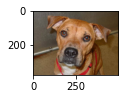

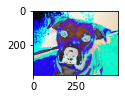

In [ ]:
#Samplewise Center - set the mean pixel value of each image to be zero (if true)
transformation = ImageDataGenerator(samplewise_center=False)
showSingle(pathEx, transformation)
transformation = ImageDataGenerator(samplewise_center=True)
showSingle(pathEx, transformation)

Section 2.33

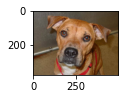

/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:356: UserWarning: This ImageDataGenerator specifies `samplewise_std_normalization`, which overrides setting of `samplewise_center`.
  warnings.warn('This ImageDataGenerator specifies '


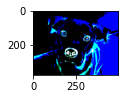

In [ ]:
#Samplewise Standard Deviation Normalization - divide each input image by its standard deviation
transformation = ImageDataGenerator(samplewise_std_normalization=False)
showSingle(pathEx, transformation)
transformation = ImageDataGenerator(samplewise_std_normalization=True)
showSingle(pathEx, transformation)

Section 2.4 Data Augmentation Pipeline

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
generators = []
paramCombos = []
def augmentationPipeline():
  # possible params under review
  # width_shift_range
  wsr = [[0,0], [-50,50],[-100,100]]
  # height_shift_range
  hsr = [0, 0.25, 0.5]
  # horizontal_flip=True/False
  hf = [False, True]
  # vertical_flip=True/False
  vf = [False, True]
  # rotation_range 0-360
  rr = [0, 90, 180]
  # brightness_range
  br = [[1,1], [0,1], [0,2]]
  # zoom_range
  zr = [[1,1],[0.66,1], [0.33,1]]
  # channel_shift_range
  csr = [0, 50, 100]
  # shear_range
  sr = [0, 25, 50]
  # fill_mode
  fm = ["nearest", "constant", "reflect", "wrap"]
  # rescale
  r = [None, 1.5, 2]
  # samplewise_center
  sc = [False, True]
  # samplewise_std_normalization
  ssn = [False, True]

  # form list of generators

  count = 1
  # for a in wsr:
  #   for b in hsr:
  #     for c in hf:
  #       for d in vf:
  #         for e in rr:
  #           for f in br:
  #             for g in zr:
  #               for h in csr:
  #                 for i in sr:
  #                   for j in fm:
  #                     for k in r:
  #                       for l in sc:
  #                         for m in ssn:
  #                           generator = ImageDataGenerator(width_shift_range=a, height_shift_range=b, horizontal_flip=c, vertical_flip=d, rotation_range=e, brightness_range=f,
  #                                                          zoom_range=g, channel_shift_range=h, shear_range=i, fill_mode=j, rescale=k, samplewise_center=l, samplewise_std_normalization=m)
  #                           print("adding imageDataGenerator #" , count)
  #                           count += 1
  #                           generators.append(generator)
  for a in wsr:
    for c in hf:
      for g in zr:  
        generator = ImageDataGenerator(width_shift_range=a, horizontal_flip=c, zoom_range=g)
        paramCombos.append("width_shift_range="+str(a)+", horizontal_flip="+str(c)+", zoom_range="+str(g))
        print("adding imageDataGenerator #" , count, "width_shift_range="+str(a)+", horizontal_flip="+str(c)+", zoom_range="+str(g))
        count += 1
        generators.append(generator)
  return generators
gens = augmentationPipeline()

adding imageDataGenerator # 1 width_shift_range=[0, 0], horizontal_flip=False, zoom_range=[1, 1]
adding imageDataGenerator # 2 width_shift_range=[0, 0], horizontal_flip=False, zoom_range=[0.66, 1]
adding imageDataGenerator # 3 width_shift_range=[0, 0], horizontal_flip=False, zoom_range=[0.33, 1]
adding imageDataGenerator # 4 width_shift_range=[0, 0], horizontal_flip=True, zoom_range=[1, 1]
adding imageDataGenerator # 5 width_shift_range=[0, 0], horizontal_flip=True, zoom_range=[0.66, 1]
adding imageDataGenerator # 6 width_shift_range=[0, 0], horizontal_flip=True, zoom_range=[0.33, 1]
adding imageDataGenerator # 7 width_shift_range=[-50, 50], horizontal_flip=False, zoom_range=[1, 1]
adding imageDataGenerator # 8 width_shift_range=[-50, 50], horizontal_flip=False, zoom_range=[0.66, 1]
adding imageDataGenerator # 9 width_shift_range=[-50, 50], horizontal_flip=False, zoom_range=[0.33, 1]
adding imageDataGenerator # 10 width_shift_range=[-50, 50], horizontal_flip=True, zoom_range=[1, 1]
add

Section 3.0 Running Datasets Through Pipeline and Evaluation

Section 3.01 Plot Function for Classifier Comparison

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plotLossAcc(hist):
  fig = plt.figure(figsize=(10,5))
  plt.subplot(1,2,1)
  plt.plot(hist.history['val_loss'])
  plt.legend(['validation'], loc='upper left')
  plt.title('Validation Loss vs Epoch: Best Loss: ' + str(round(min(hist.history['val_loss']), 3)))
  plt.ylabel('validation loss')
  plt.xlabel('Epoch')
  plt.subplot(1,2,2)
  plt.plot(hist.history['val_accuracy'])
  plt.legend(['validation'], loc='upper left')
  plt.title('Validation Accuracy vs Epoch: Best Accuracy: ' + str(round(max(hist.history['val_accuracy']), 3)))
  plt.ylabel('validation accuracy')
  plt.xlabel('Epoch')

def get_cmap(n, name='hsv'):
    return plt.cm.get_cmap(name, n)

def plotlossAccMany(histories, dataset, loss, acc, gen):
  fig = plt.figure(figsize=(20,10))
  count = 0
  colors = get_cmap(18)
  color_list = colors(np.linspace(0, 1, 18))
  plt.subplot(1,2,1)
  bestLoss = "Best Loss: " + str(loss)
  plt.legend(['validation'], loc='upper left')
  plt.title('Validation Loss vs Epoch: ' + dataset + "\n" + bestLoss + "\n Generator Responsible: " + str(paramCombos[gen]))
  plt.ylabel('Validation Loss')
  plt.xlabel('Epoch')
  for hist in histories:
    plt.plot(hist['val_loss'], color=color_list[count])
    count += 1
  plt.subplot(1,2,2)
  plt.legend(['validation'], loc='upper left')
  bestAcc = "Best Accuracy: " + str(acc)
  plt.title('Validation Accuracy vs Epoch: ' + dataset + "\n" + bestAcc + "\n Generator Responsible: " + str(paramCombos[gen]))
  plt.ylabel('Validation Accuracy')
  plt.xlabel('Epoch')
  count = 0
  for hist in histories:
    plt.plot(hist['val_accuracy'], color=color_list[count])
    count += 1


Section 3.1 Baseline Classifier for Dogs vs. Cats

In [ ]:
import tensorflow as tf
# Base model takes approximately 20 minutes to fit using cpu, approximately 3 minutes using GPU accelerator
#Fit Data
model = getModel()
trainData = tf.keras.preprocessing.image_dataset_from_directory('/content/train',	labels="inferred", label_mode="int", color_mode="rgb", batch_size=32, image_size=(64,64))
testData = tf.keras.preprocessing.image_dataset_from_directory('/content/test',	labels="inferred", label_mode="int", color_mode="rgb", batch_size=32, image_size=(64,64))
history = model.fit(trainData, steps_per_epoch=len(trainData), validation_data=testData, validation_steps=len(testData), epochs=30, verbose=1)
print("model fitted, performing accuracy measures")
loss, acc = model.evaluate(testData, batch_size=32, verbose=1, sample_weight=None)
print("loss: "+ str((loss)) + " , accuracy: " + str((acc * 100.0)))

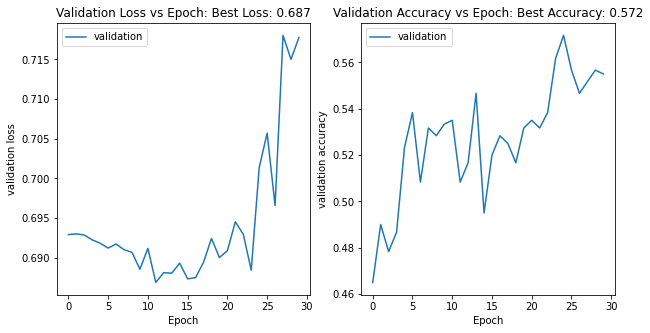

In [ ]:
plotLossAcc(history)

Section 3.2 Proof of Concept:  Augmentation Pipeline on Dogs vs Cats


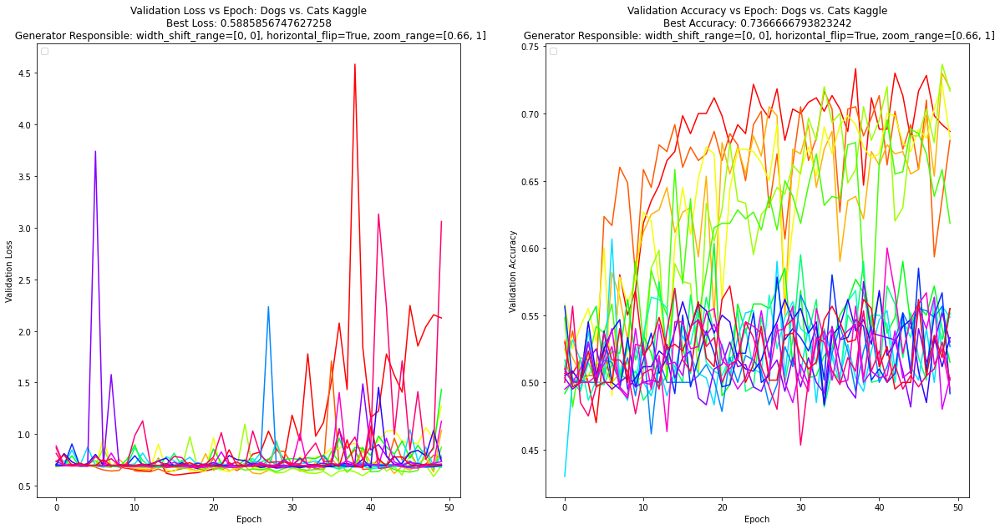

In [ ]:
with zipfile.ZipFile("/content/DC.zip","r") as z:
    z.extractall(".")
histories = []
bestAcc = 0
bestLoss = 100
gen = 0
for i in range(18):
  count = i + 1
  modelStringName = '/content/content/DC/model' + str(count)
  history = pickle.load(open(modelStringName, "rb"))
  histories.append(history)
  tempLoss = min(history['val_loss'])
  tempAcc = max(history['val_accuracy'])
  if tempLoss < bestLoss:
    bestLoss = tempLoss
  if tempAcc > bestAcc:
    bestAcc = tempAcc
    gen = count - 1
plotlossAccMany(histories, "Dogs vs. Cats Kaggle", bestLoss, bestAcc, gen)

Section 3.3 CIFAR-10 Dataset Augmentations

Section 3.31 Augmentation pipeline for CIFAR-10 datasets to determine which combination produces best classification

In [ ]:
import tensorflow as tf
import pickle
import zipfile
import os

def runGenerators(trainPath, testPath, datasetName):
  accuracies = []
  histories = []
  models = []
  bestGen = 0
  bestAcc = 0
  count = 1
  fileName = "/content/models/" + datasetName + ".zip"
  os.makedirs(os.path.dirname(fileName), exist_ok=True)
  zf = zipfile.ZipFile(fileName, "w")
  for generator in gens:
    # get new model each time
    model = getModel()
    # make augmentations, resize CIFAR-10 data from 32x32 to 64x64 
    trainData = generator.flow_from_directory(trainPath, class_mode='binary', batch_size=32, target_size=(64, 64))
    # Only resize testing data. Do not perform augmentations
    testData = tf.keras.preprocessing.image_dataset_from_directory(testPath,	labels="inferred", label_mode="int", color_mode="rgb", batch_size=32, image_size=(64,64))

    # fit model and check accuracy / validation loss
    history = model.fit(trainData, steps_per_epoch=len(trainData), validation_data=testData, validation_steps=len(testData), epochs=30, verbose=0)
    
    # evaluate model
    loss, acc = model.evaluate(testData, batch_size=32, verbose=1, sample_weight=None)
    if acc > bestAcc:
      bestAcc = acc
      bestGen = count - 1
    # save model
    modelStringName = '/content/models/' + datasetName + "/model" + str(count)
    os.makedirs(os.path.dirname(modelStringName), exist_ok=True)
    with open(modelStringName, 'wb') as file_pi:
        pickle.dump(history.history, file_pi)
    zf.write(modelStringName)
    histories.append(history)
    models.append(model)
    accuracies.append(acc)
    print("Model #", count, " Completed")
    count += 1
  accGenFile = "/content/models/" + datasetName + "/accGen"
  dumpStat = [bestAcc, bestGen]
  with open(accGenFile, 'wb') as f:
    pickle.dump(dumpStat, f)
  zf.write(accGenFile)  
  zf.close()
  return bestAcc, bestGen

Section 3.4 Run data augmentation pipleine on combination of 10 CIFAR datasets.
(10 Choose 2) = 45 comparisons

In [ ]:
# This is where you will start running
import tensorflow as tf
from google.colab import files
import pickle
import zipfile
import os
classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
bestAccuracies = []
augmentationPipelieResponsible = []
count = 1
for i in range(10):
    for j in range(i, 10):
      if(i != j):
        name = "/content/" + classes[i] + classes[j] + ".zip"
        saveName = "" + classes[i] + classes[j] + "Models"
        with zipfile.ZipFile(name,"r") as g:
          g.extractall(".")
        dataTrain = "/content/" + classes[i] + classes[j] + "/train"
        dataTest = "/content/" + classes[i] + classes[j] + "/test"
        fileName = "/content/models/" + saveName + ".zip"
        fileName2 = "/content/"+ classes[i] + classes[j]+ "Models.zip"
        if(os.path.exists(fileName) == False and os.path.exists(fileName2) == False):
          print("Running data set: " + str(count) + " , dataname: " + name)
          accuracy, augmentation = runGenerators(dataTrain, dataTest, saveName)
          bestAccuracies.append(accuracy)
          augmentationPipelieResponsible.append(augmentation)
          downloadName = "/content/models/" + classes[i] + classes[j] + "Models.zip"
          files.download(downloadName)
          count += 1
        else:
          count += 1
          print("file already exists, moving on")

file already exists, moving on
Running data set: 2 , dataname: /content/planebird.zip
Found 2000 images belonging to 2 classes.
Found 600 files belonging to 2 classes.
19/19 [==============================] - 0s 7ms/step - loss: 0.4371 - accuracy: 0.8400
Model # 1  Completed
Found 2000 images belonging to 2 classes.
Found 600 files belonging to 2 classes.
19/19 [==============================] - 0s 8ms/step - loss: 0.4313 - accuracy: 0.8017
Model # 2  Completed
Found 2000 images belonging to 2 classes.
Found 600 files belonging to 2 classes.
19/19 [==============================] - 0s 8ms/step - loss: 0.4377 - accuracy: 0.8033
Model # 3  Completed
Found 2000 images belonging to 2 classes.
Found 600 files belonging to 2 classes.
19/19 [==============================] - 0s 7ms/step - loss: 0.5440 - accuracy: 0.7350
Model # 4  Completed
Found 2000 images belonging to 2 classes.
Found 600 files belonging to 2 classes.
19/19 [==============================] - 0s 8ms/step - loss: 0.3722 - ac

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Running data set: 3 , dataname: /content/planecat.zip
Found 2000 images belonging to 2 classes.
Found 600 files belonging to 2 classes.
19/19 [==============================] - 0s 7ms/step - loss: 0.3814 - accuracy: 0.8667
Model # 1  Completed
Found 2000 images belonging to 2 classes.
Found 600 files belonging to 2 classes.
19/19 [==============================] - 0s 7ms/step - loss: 0.4306 - accuracy: 0.8200
Model # 2  Completed
Found 2000 images belonging to 2 classes.
Found 600 files belonging to 2 classes.
19/19 [==============================] - 0s 7ms/step - loss: 0.4135 - accuracy: 0.8117
Model # 3  Completed
Found 2000 images belonging to 2 classes.
Found 600 files belonging to 2 classes.
19/19 [==============================] - 0s 7ms/step - loss: 0.2926 - accuracy: 0.8850
Model # 4  Completed
Found 2000 images belonging to 2 classes.
Found 600 files belonging to 2 classes.
19/19 [==============================] - 0s 7ms/step - loss: 0.2768 - accuracy: 0.8900
Model # 5  Comple

Section 3.5 Plot Validation Loss and Accuracy for Each Binary Classifier

In [ ]:
# unpack pretrained models
import zipfile
name = "/content/models.zip"
with zipfile.ZipFile(name, "r") as z:
          z.extractall(".")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


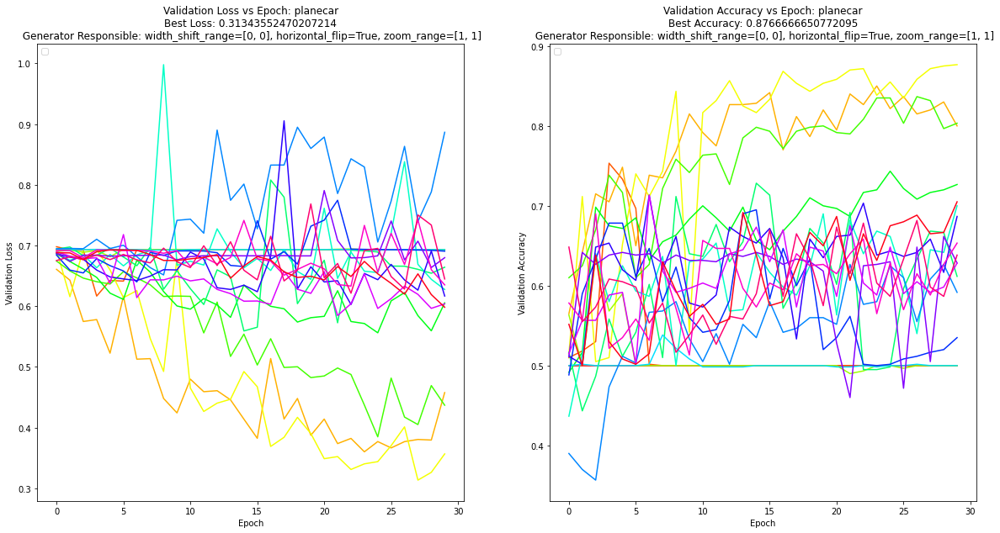

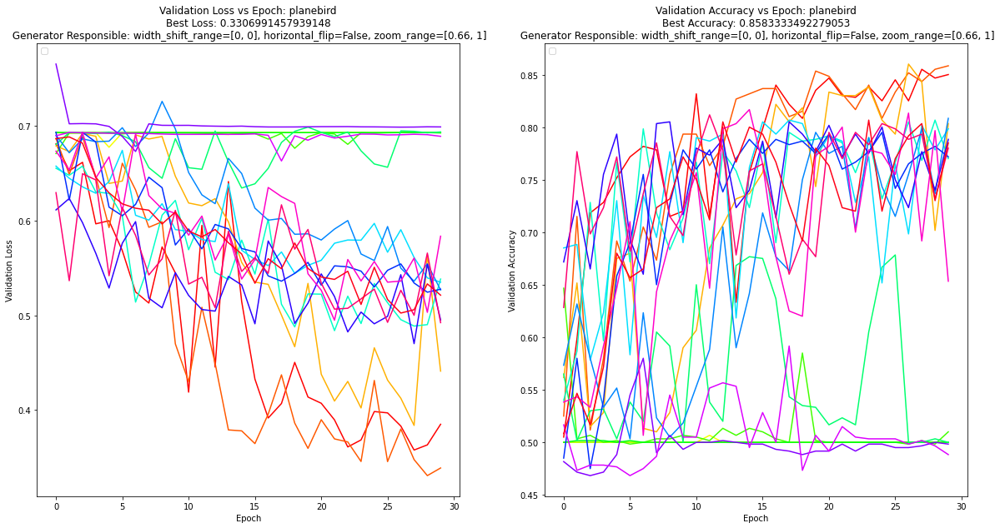

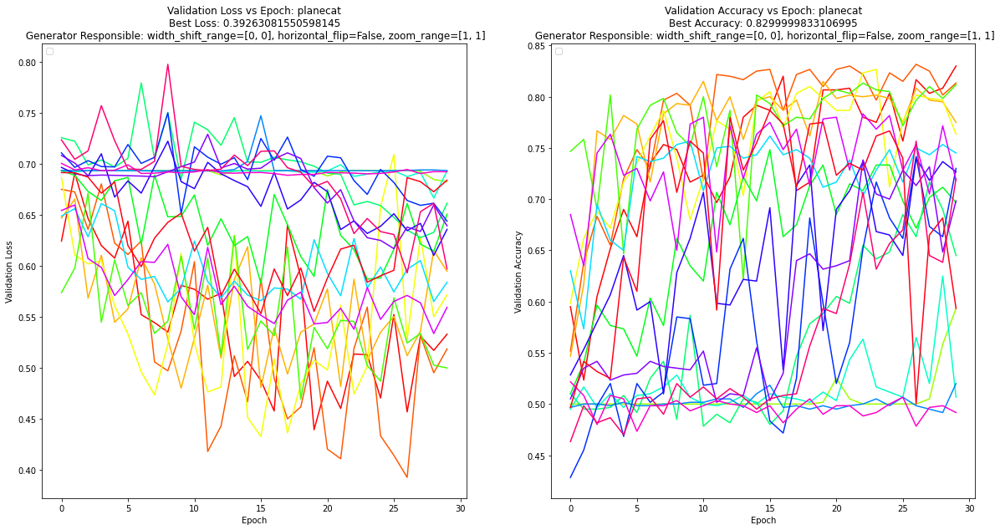

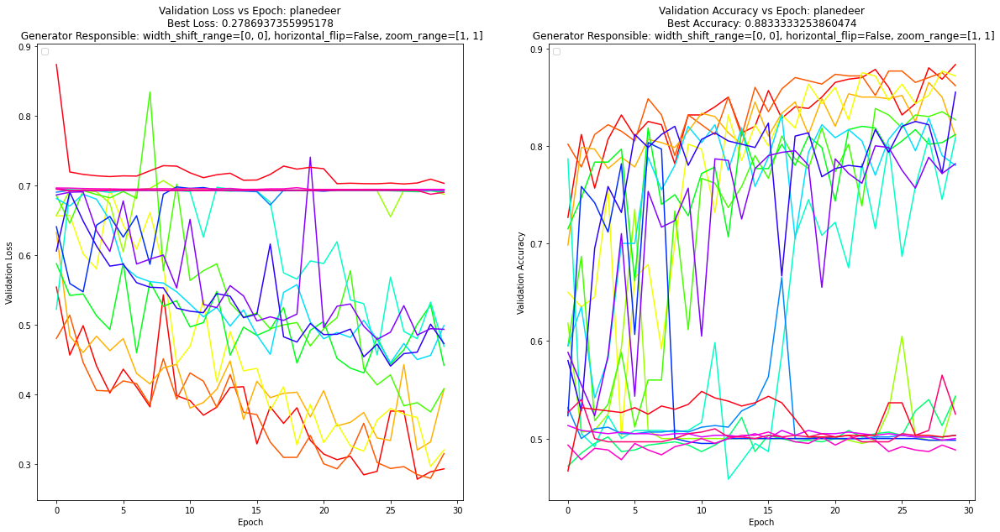

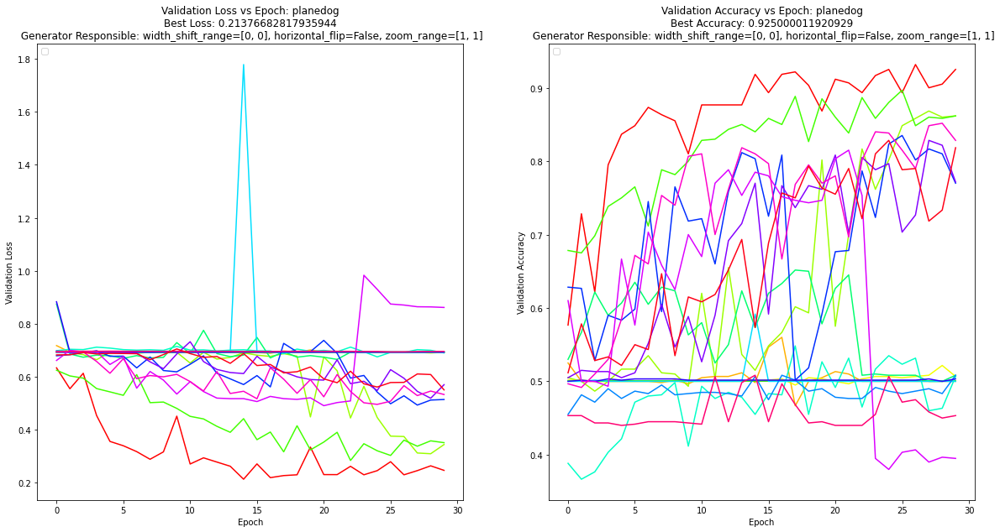

...

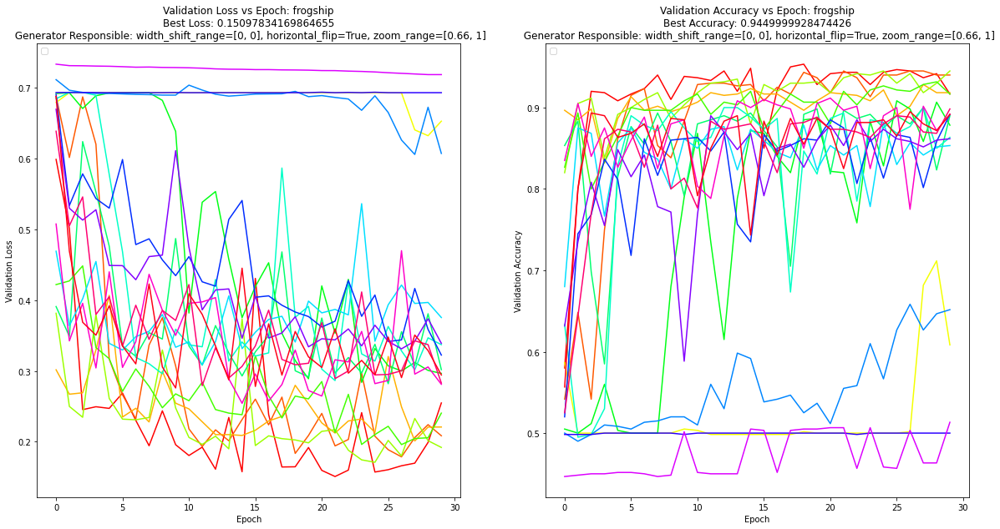

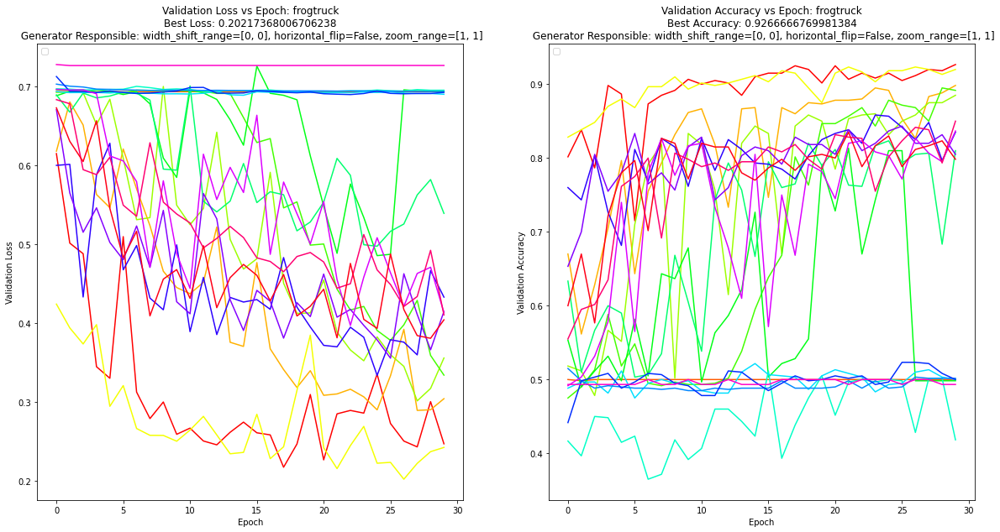

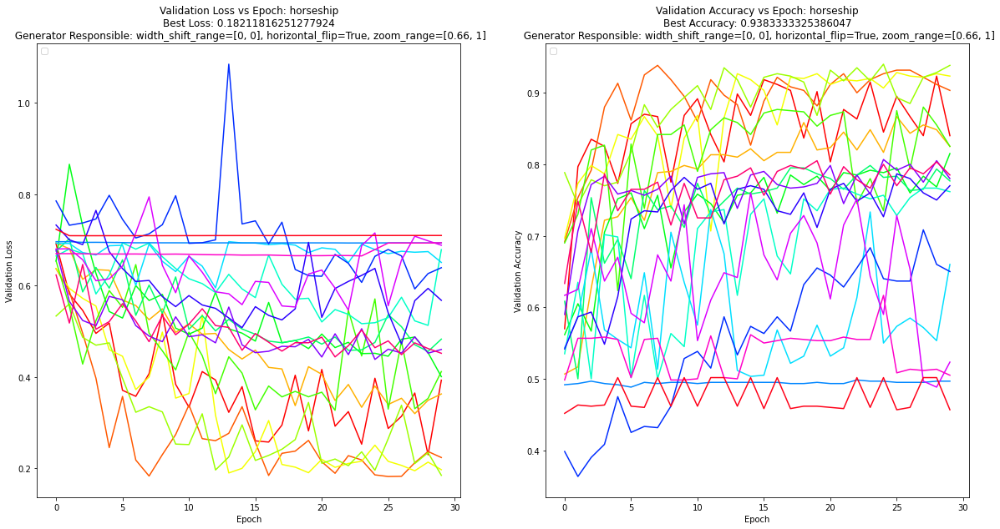

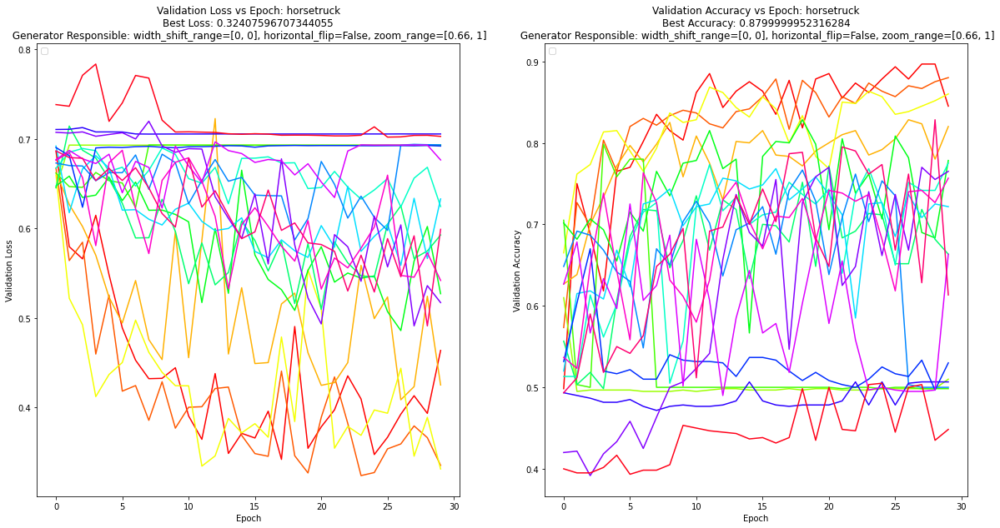

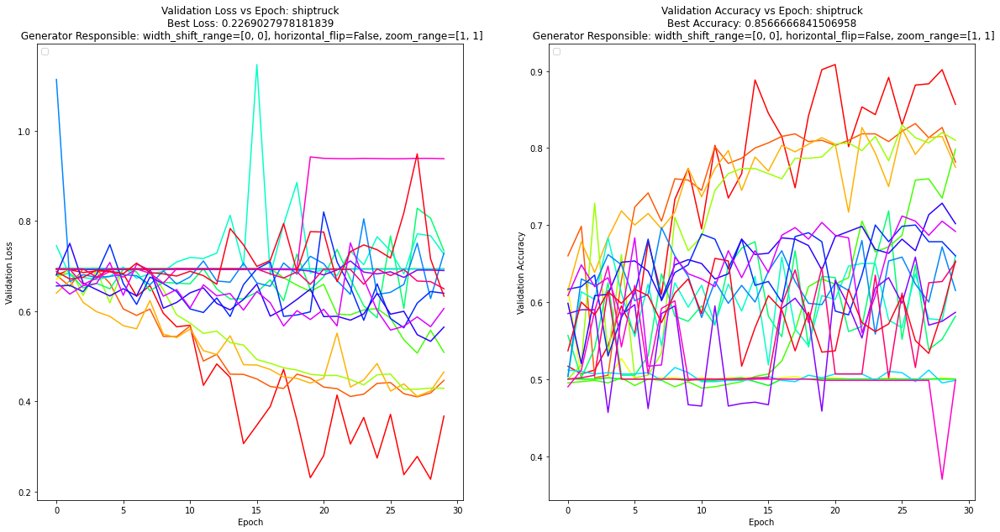

In [ ]:
import pickle
classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
augmentationPipelineResponsible = []
for i in range(10):
    for j in range(i, 10):
      if(i != j):
        name = "/content/models/" + classes[i] + classes[j] + "Models.zip"
        with zipfile.ZipFile(name, "r") as z:
          z.extractall(".")
        histories = []
        smallLoss = 100
        for t in range(18):
          count = t + 1
          modelStringName = "/content/content/models/" + classes[i] + classes[j] + "Models/model" + str(count)
          history = pickle.load(open(modelStringName, "rb"))
          histLoss = min(history['val_loss'])
          if histLoss < smallLoss:
            smallLoss = histLoss
          histories.append(history)
        accGenFile = "/content/content/models/" + classes[i] + classes[j] + "Models/accGen"
        datasetName = "" + classes[i] + classes[j]
        dat = pickle.load(open(accGenFile, "rb"))
        bestAcc = dat[0]
        gen = dat[1]
        augmentationPipelineResponsible.append(gen)
        plotlossAccMany(histories, datasetName, smallLoss, bestAcc, gen)
  

Section 3.6 Summary Statitstics for CIFAR-10


In [ ]:
import statistics 
from collections import Counter
from itertools import groupby
import matplotlib.pyplot as plt

planeGens = []
carGens = []
birdGens = []
catGens = []
deerGens = []
dogGens = []
frogGens = []
horseGens = []
shipGens = []
truckGens = []
allGens = [planeGens, carGens, birdGens, catGens, deerGens, dogGens, frogGens, horseGens, shipGens, truckGens]
count = 0
# add augmentation params to class param list
for i in range(10):
  for j in range(i, 10):
    if(i != j):
      allGens[i].append(augmentationPipelineResponsible[count])
      allGens[j].append(augmentationPipelineResponsible[count])
      count += 1
# print out class list for the generators used for the best binary classification of each class
count = 0
for g in allGens:
  print("Dataset: " + classes[count] + " Best Generators:")
  for spec in g:
    print(paramCombos[spec])
  freqs = groupby(Counter(g).most_common(), lambda x:x[1])
  bg = [val for val,count in next(freqs)[1]]
  print("Most Useful Generator(s) for: " + classes[count])
  for b in bg:
    print(paramCombos[b])
  count += 1

# count how many time each hyper param appears in best data generators
Counter(augmentationPipelineResponsible)
c = Counter(augmentationPipelineResponsible)
plt.bar(c.keys(), c.values())
plt.xticks(np.arange(min(c.values())-1, max(c.values())+1, 1.0))
plt.yticks(np.arange(min(c.values())-1, max(c.values())+1, 1.0))
plt.ylabel("Count of Generator Used")
plt.xlabel("Generator")
plt.title("Best Data Generators for Binary Classification of CIFAR-10")

NameError: ignored

Section 4.0: Classifying Structural Properties of Image Classes


In [ ]:
# adjust tensorflow version
%tensorflow_version 2.x

Section 4.1: Downloading Pretrained Classifier / Adjusting Parameters

In [ ]:
import zipfile
# Borrowed pretrained structural classifier from Github user: Keyur Rathod
# ! git clone https://github.com/keyurr2/shape-classifier-cnn.git
# ! git pull
# ! pip install -r shape-classifier-cnn/requirements.txt

# had to adjust the following parameters for configuration:
# tensorboard==1.8.0  ->  tensorboard==2.5.0
# tensorflow==1.8.0   ->  tensorflow== 2.5.0

# Also will continue to run but after 10 seconds you can force quit while 
# still obtaining all the necessary files 

# Now just unzip files and proceed with notebook
with zipfile.ZipFile("/content/shape-classifier-cnn.zip","r") as z:
    z.extractall(".")
! pip install -r /content/content/shape-classifier-cnn/requirements.txt

     |████████████████████████████████| 12.2MB 250kB/s 
     |████████████████████████████████| 13.1MB 200kB/s 
     |████████████████████████████████| 26.1MB 124kB/s 
     |████████████████████████████████| 9.5MB 19.2MB/s 
     |████████████████████████████████| 31.2MB 97kB/s 
     |████████████████████████████████| 307kB 37.0MB/s 
     |████████████████████████████████| 51kB 8.1MB/s 
     |████████████████████████████████| 184kB 56.5MB/s 
  Created wheel for numpydoc: filename=numpydoc-0.8.0-cp37-none-any.whl size=23065 sha256=69dd22f40fe60b3b97a677be268673dc08b3266ad7265d31c8d06d794dbeb570
  Stored in directory: /root/.cache/pip/wheels/ea/55/7f/3e25d754760ccd62d6796e5b2cfe25629346f52ea00753d549
ERROR: Operation cancelled by user


Section 4.2: Train Classifer

In [ ]:
# Train the neural network
# changes to cnn.py
# Changed maxpooling layer to include  padding='same'
# Changed file path from shapes/train to '/content/shape-classifier-cnn/shapes/train'
# Changed file path from shapes/test to '/content/shape-classifier-cnn/shapes/test
# changes to visualization.py
# Changed history['acc'] to history['accuracy'] and same for validation accuracy
! python /content/content/shape-classifier-cnn/cnn.py

2021-06-10 23:59:41.871591: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-10 23:59:43.155772: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-10 23:59:43.182237: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-10 23:59:43.182824: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-10 23:59:43.182867: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-10 23:59:43.185544: I tensorflow/stream_executor/platform/default

In [ ]:
# Save files in Shape-classifier-cnn so we don't have to make adjustments every time

!zip -r /content/shape-classifier-cnn.zip /content/content/shape-classifier-cnn

Streaming output truncated to the last 5000 lines.
updating: content/content/shape-classifier-cnn/shapes-dataset-practice/triangle/2956.png (deflated 16%)
updating: content/content/shape-classifier-cnn/shapes-dataset-practice/triangle/754.png (deflated 20%)
updating: content/content/shape-classifier-cnn/shapes-dataset-practice/triangle/1824.png (deflated 12%)
updating: content/content/shape-classifier-cnn/shapes-dataset-practice/triangle/3057.png (deflated 17%)
updating: content/content/shape-classifier-cnn/shapes-dataset-practice/triangle/2011.png (deflated 14%)
updating: content/content/shape-classifier-cnn/shapes-dataset-practice/triangle/3362.png (deflated 17%)
updating: content/content/shape-classifier-cnn/shapes-dataset-practice/triangle/2202.png (deflated 13%)
updating: content/content/shape-classifier-cnn/shapes-dataset-practice/triangle/3458.png (deflated 12%)
updating: content/content/shape-classifier-cnn/shapes-dataset-practice/triangle/1154.png (deflated 15%)
updating: cont

In [ ]:
# Test if classifer works
import cv2

! python /content/content/shape-classifier-cnn/predict.py --image /content/AllCifar10data/automobileTest/1001.png

                                                                        
# Debugging image size to fit pretrained classifier
# img=cv2.imread('/content/AllCifar10data/automobileTest/1001.png')
# print(img)
# try:
#     img = cv2.resize(img, (28, 28), interpolation=cv2.INTER_AREA)
#     print(img.shape)
#     print("image resized to 282828282828282")
# except:
#   height, width , layers = img.shape
#   size=(width,height)
#   print(size)

2021-06-11 00:47:48.962354: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-11 00:47:50.442309: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-11 00:47:50.469856: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-11 00:47:50.470473: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-11 00:47:50.470526: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-11 00:47:50.473209: I tensorflow/stream_executor/platform/default

In [ ]:
Section 4.3: Classify Cifar 10 Dataset Structural Properties

In [ ]:
# Classify Each Test Set on Shape Classifier
!python /content/content/shape-classifier-cnn/predict.py --testdata

2021-06-11 01:21:39.841783: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-11 01:21:41.358904: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-11 01:21:41.389610: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-11 01:21:41.390229: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-11 01:21:41.390285: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-11 01:21:41.392855: I tensorflow/stream_executor/platform/default

References:


See Project Report
